In [1]:
import os
import pandas as pd
import numpy as np
import pingouin as pg
import seaborn as sns; sns.set_theme()
import matplotlib.pyplot as plt
import warnings


#libraries
import pandas as pd
import numpy as np
import os
import sys
import shutil
import glob
import joblib
import warnings
from datetime import date, datetime

from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import LeavePGroupsOut
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import pearsonr
import scipy.stats as st

from nilearn import image as nli
from nilearn import plotting

from matplotlib.colors import LinearSegmentedColormap

sns.set_style("whitegrid", {'axes.grid' : False})

In [2]:
#@title Import functions
%matplotlib inline  
#!pip install brainspace --quiet
import ipywidgets as widgets  

# Interactive plots
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets # interactive display
my_layout = widgets.Layout()

import numpy as np
from brainspace.datasets import load_conte69
from brainspace.plotting import plot_hemispheres, plot_surf
from brainspace.utils.parcellation import map_to_labels
from brainspace.mesh import mesh_cluster
import panel as pn
pn.extension('vtk')
import os # OS to handle paths
import pandas as pd # pandas for data framse
import csv
import urllib.request as urllib2

import matplotlib.pyplot as plt # For changing the color maps
from matplotlib import cm # cm=colormap
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# from hcp_regions import HCPRegions
import ipywidgets as widgets       # interactive display

from brainspace.datasets import load_fsa5
from nilearn import datasets
from brainspace.utils.parcellation import reduce_by_labels

##### Load data

In [3]:
path_img_out = '/media/hcs-psy-narun/Alina/HCP_results/predicted_values_for_datasets_5/plots_article/plots_feat_dud45/'

In [4]:
path= '/media/data/Dunedin_Study_Data_Narun_P_Jan2022/MLTabs_retest/' 
path_s1200 = '/media/data/Dunedin_Study_Data_Narun_P_Jan2022/MLTabs/'

In [6]:
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

#features tables as dictionary
features_retest_test2 = {
    'stroop':pd.read_csv(path+'stroop.csv', index_col=0),
    'faces':pd.read_csv(path+'faces.csv', index_col=0),
    'facename':pd.read_csv(path+'facename.csv', index_col=0),
    'mid':pd.read_csv(path+'mid.csv', index_col=0),
    
    'stroop_FC':pd.read_csv(path+'stroop_FC.csv', index_col=0),
    'faces_FC':pd.read_csv(path+'faces_FC.csv', index_col=0),
    'facename_FC':pd.read_csv(path+'facename_FC.csv', index_col=0),
    'mid_FC':pd.read_csv(path+'mid_FC.csv', index_col=0),    
    
    'cort':pd.read_csv(path+'cort_thck.csv', index_col=0),
    'surf':pd.read_csv(path+'cort_area.csv', index_col=0),    
    'subc':pd.read_csv(path+'subc_vol.csv', index_col=0),
    'rest':pd.read_csv(path+'rest.csv', index_col=0),
    'brainVol':pd.read_csv(path+'total_vol.csv', index_col=0)
}


#demography
demo_retest_test2 = pd.read_csv(path_s1200+'info.csv', index_col=0).iloc[:,0]
demo_retest_test2 = demo_retest_test2.reindex(index=features_retest_test2['brainVol'].index)

#targets table
targ_retest_test2 = pd.read_csv(path_s1200+'info.csv', index_col=0).iloc[:,1:]
targ_retest_test2 = pd.DataFrame(targ_retest_test2.reindex(index=features_retest_test2['brainVol'].index))

#table with movements (mean relative displacement Movement_RelativeRMS_mean.txt)
movements_retest_test2 = pd.read_csv(path+'movements.csv', index_col=0)

#create tables with 2 controling parameters: gender and age
sex_coded_retest_test2 = pd.Series(LabelEncoder().fit_transform(demo_retest_test2.values), 
                                   index=demo_retest_test2.index, name='sex')

control_retest_test2 = sex_coded_retest_test2

In [7]:
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

#demography
demo_main = pd.read_csv(path_s1200+'info.csv', index_col=0).iloc[:,0]

#targets table
targ_main = pd.read_csv(path_s1200+'info.csv', index_col=0).iloc[:,1:]

#features tables as dictionary
features_main = {
    'stroop':pd.read_csv(path_s1200+'stroop.csv', index_col=0),
    'faces':pd.read_csv(path_s1200+'faces.csv', index_col=0),
    'facename':pd.read_csv(path_s1200+'facename.csv', index_col=0),
    'mid':pd.read_csv(path_s1200+'mid.csv', index_col=0),
    
    'stroop_FC':pd.read_csv(path_s1200+'stroop_FC.csv', index_col=0),
    'faces_FC':pd.read_csv(path_s1200+'faces_FC.csv', index_col=0),
    'facename_FC':pd.read_csv(path_s1200+'facename_FC.csv', index_col=0),
    'mid_FC':pd.read_csv(path_s1200+'mid_FC.csv', index_col=0),    
    
    'cort':pd.read_csv(path_s1200+'cort_thck.csv', index_col=0),
    'surf':pd.read_csv(path_s1200+'cort_area.csv', index_col=0),    
    'subc':pd.read_csv(path_s1200+'subc_vol.csv', index_col=0),
    'rest':pd.read_csv(path_s1200+'rest.csv', index_col=0),
    'brainVol':pd.read_csv(path_s1200+'total_vol.csv', index_col=0)
}


#table with movements (mean relative displacement Movement_RelativeRMS_mean.txt)
movements_main = pd.read_csv(path_s1200+'movements.csv', index_col=0)

#create tables with 2 controling parameters: gender and age
sex_coded_main = pd.Series(LabelEncoder().fit_transform(demo_main.values), 
                      index=demo_main.index, name='sex')

control_main = sex_coded_main

In [8]:
#spliting main ito train and retest_test1

demo_retest_test1 = demo_main.reindex(index=demo_retest_test2.index)
targ_retest_test1 = pd.DataFrame(targ_main.reindex(index=demo_retest_test2.index))
movements_retest_test1 = movements_main.reindex(index=demo_retest_test2.index)
control_retest_test1 = control_main.reindex(index=demo_retest_test2.index)
features_retest_test1 = {}
for key in features_main.keys():
    features_retest_test1[key] = features_main[key].reindex(index=demo_retest_test2.index)


demo_train = demo_main.drop(demo_retest_test2.index, axis=0)
targ_train = pd.DataFrame(targ_main.drop(demo_retest_test2.index, axis=0))
movements_train = movements_main.drop(demo_retest_test2.index, axis=0)
control_train = control_main.drop(demo_retest_test2.index, axis=0)
features_train = {}
for key in features_main.keys():
    features_train[key] = features_main[key].drop(demo_retest_test2.index, axis=0)



##### Calculate ICC for each brain's ROI or feature

In [ ]:
#uncomment this section if run for the first time
#it may take a couple of hours

"""print('start', datetime.now())

dct_icc_brain = {}

for mod in list(features_retest_test2.keys()):
    print(mod, datetime.now())
    #load tables with stacked y_pred
    dff1 = features_retest_test1[mod]#pd.read_csv(path+mod+'_retest1.csv', index_col=0)
    dff2 = features_retest_test2[mod]

    i = 0
    dct_icc={}
    while i < len(dff1.columns):
        #create tables for pingouin format
        df1=dff1.iloc[:,i]
        df2=dff2.iloc[:,i]
        df_comp = pd.DataFrame({'subj': np.append(df1.index, df2.index),
                                'trial': np.append(np.full(len(df1.index), 1), np.full(len(df2.index), 2)),
                                'scores': np.array(pd.concat([df1, df2], axis=0))})

        icc_table = pg.intraclass_corr(data = df_comp, targets='subj', raters='trial', ratings='scores')

        dct_icc[dff1.iloc[:,i].name] = pd.Series({'ICC2' : icc_table.iloc[1,2], 
                                                  'ICC3' : icc_table.iloc[2,2],
                                                  'CI2' : icc_table.iloc[1,7], 
                                                  'CI3' : icc_table.iloc[2,7]} )

        i+=1

    df_icc = pd.DataFrame(dct_icc).T

    dct_icc_brain[mod] = df_icc['ICC3']
    
print('finish', datetime.now())

#save output
joblib.dump(dct_icc_brain,  (path_img_out+'dct_icc_brain_nonadj.sav'))"""

In [5]:
#uncomment and use this section if needs to load already calculated results

dct_icc_brain = joblib.load(path_img_out+'dct_icc_brain_nonadj.sav', mmap_mode='r')

##### Mean ICC for each modality

In [6]:
av_icc = {}
for key in dct_icc_brain.keys():
    av_icc[key] = dct_icc_brain[key].mean()
df_av_icc = pd.Series(av_icc)
#df_av_icc.drop('target_y')

display(df_av_icc.sort_values(ascending=False))

brainVol       0.989709
subc           0.930188
surf           0.915384
cort           0.852677
mid            0.452829
faces          0.350881
rest           0.332801
faces_FC       0.288848
stroop_FC      0.284702
facename_FC    0.238264
facename       0.205315
mid_FC         0.072173
stroop         0.018023
dtype: float64

##### Plot

##### Task contrasts

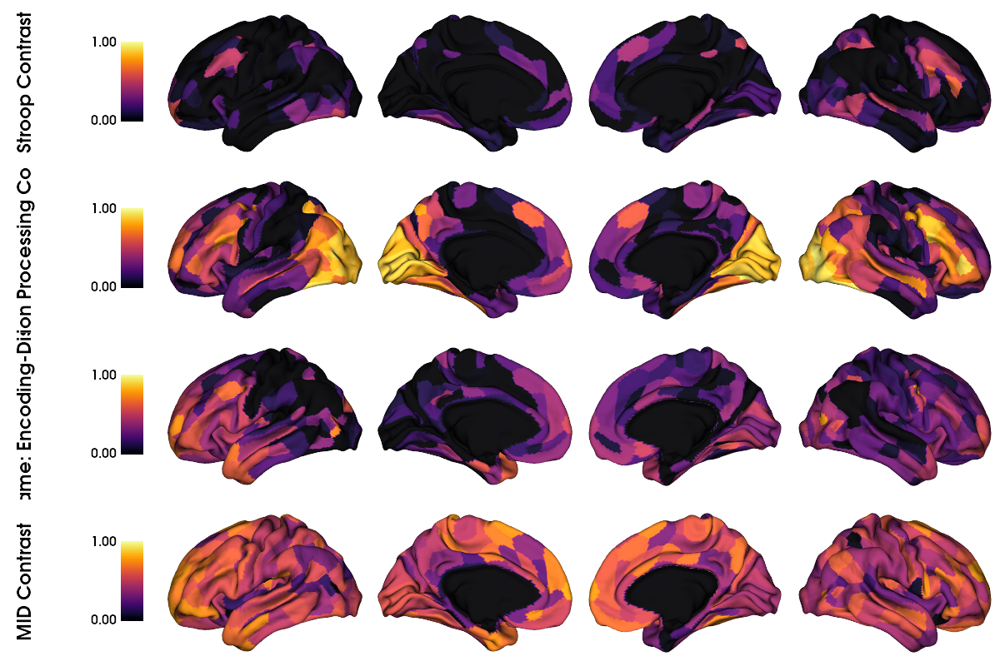

In [38]:
# First load the Glasser annotation file
file_url='https://raw.githubusercontent.com/rcruces/2020_NMA_surface-plot/master/data/glasser_360_conte69.csv'
Glasser = np.loadtxt(urllib2.urlopen(file_url), dtype=int)

# and load the conte69 surfaces
surf_lh, surf_rh = load_conte69()


# Mask the 0-value ROI of the medial wall
mask = Glasser != 0

task_keys = ['stroop', 'faces', 'facename', 'mid']
task_keys_lab = ['Stroop Contrast',
                 'Emotion Processing Contrast',
                 'Facename: Encoding-Distractor',
                 'MID Contrast',]
task = [None] * len(task_keys)

for i, tkey in enumerate(task_keys):
    
    icc_brain = dct_icc_brain[tkey].mask(dct_icc_brain[tkey] <= 0).fillna(0)
    
    # add a 0 entry that will match the medial wall index of the final array
    rho = np.concatenate((0, icc_brain[:360].values.astype(float)), axis=None)
    # Map the vector values to the vertices indices
    rho_ver = map_to_labels(rho, Glasser,fill=np.nan)
    
    task[i] = rho_ver

cmap='inferno'#'hot_r'#'YlOrRd'#sns.color_palette("light:r", as_cmap=True)#LinearSegmentedColormap.from_list('postv', ['white', 'red'])

# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=task,    # Vector of alues to plot
                 size=(1200, 200*len(task_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap=cmap,#'YlOrRd',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range=(0,1),#'sym',#(-0.13, 0.13),       # color range
                 nan_color=(0, 0, 0, 1), # nan-color (medial wall) 
                 background = (1, 1, 1),# Background color, 
                 label_text=task_keys_lab
                )



stroop


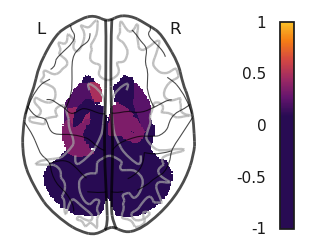

faces


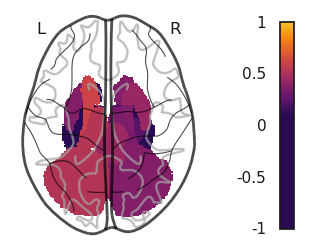

facename


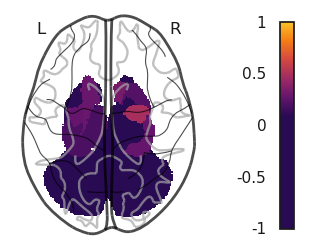

mid


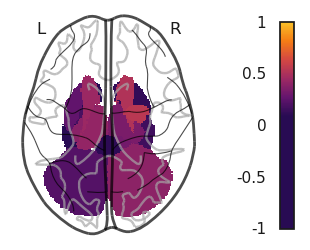

In [39]:
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

#plot task contrasts on one brain projection, subcortex only

#load atlases
wway = '/media/hcs-psy-narun/Alina/atlases/'
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat2 = atlas2.get_fdata()

cmap = LinearSegmentedColormap.from_list('postv', [#'#280b53', '#280b53', '#280b53',
                                            '#280b53', '#280b53', '#280b53','#280b53', '#280b53', '#280b53',
                                            '#280b53', '#65156e', '#9f2a63', '#d44842', '#f57d15', '#fac228'])

for key in ['stroop', 'faces', 'facename', 'mid']: #contrasts only
    #empty image in the same way as reffered atlas
    site_nii2 = np.zeros(par_dat2.shape)
    #dataframe to plot
    data = dct_icc_brain[key]#.mask(dct_icc_brain[key] < 0.4).fillna(0)   
    
    #subcortex, the table has same order as atlas
    vec2 = pd.Series((data[360:]).values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )

    for index, numb in zip(vec2.index, vec2.iloc[:]): 
        site_nii2[par_dat2 == (index)] = numb
    
    #create image object
    site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
    
    #display
    print(key)
    display2 = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap=cmap,#'RdYlBu_r',       
                                         colorbar=True, display_mode='z',
                                         vmin=0, vmax=1,)
                                         #threshold=0, symmetric_cbar=True)
    
    plt.savefig(path_img_out+'ICC_Brain_NoAdj_tasks_subc_'+key+'_plot_image.svg',bbox_inches='tight')
    
    plotting.show()

##### Structural MRI

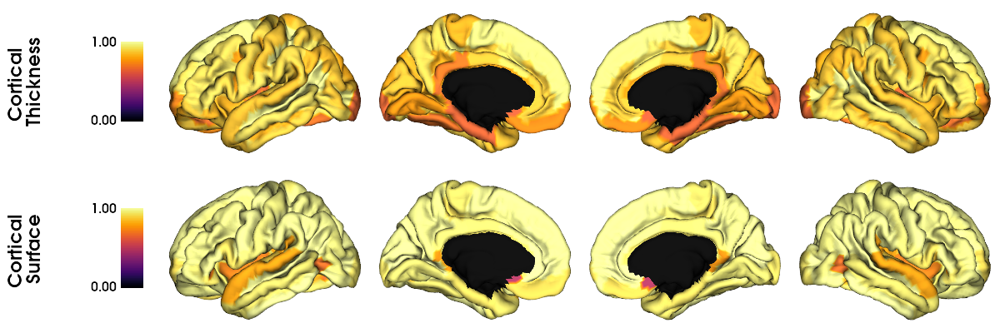

In [40]:
# Fetch surface atlas
destrx = datasets.fetch_atlas_surf_destrieux()

# Load fsaverage5 surfaces
surf_lh, surf_rh = load_fsa5()

# Remove non-cortex regions
regions = destrx['labels'].copy()
masked_regions = [b'Medial_wall', b'Unknown']
masked_labels = [regions.index(r) for r in masked_regions]
for r in masked_regions:
    regions.remove(r)

# Build Destrieux parcellation and mask
labeling = np.concatenate([destrx['map_left'], destrx['map_right']])
mask_destrx = ~np.isin(labeling, masked_labels)


# Map gradients to original parcels
anat_keys = ['cort', 'surf']
anat_keys_lab = ['Cortical \nThickness', 
                 'Cortical \nSurface']
anat = [None] * len(anat_keys)
for i, akey in enumerate(anat_keys):
    rho = map_to_labels(dct_icc_brain[akey].values.astype('float'), 
                        labeling, mask=mask_destrx, fill=np.nan)
    
    anat[i] = rho

plot_hemispheres(surf_lh, surf_rh, 
                 array_name=anat, 
                 size=(1200, 200*len(anat_keys)), 
                 cmap='inferno',
                 color_bar='left', 
                 zoom=1.5,
                 embed_nb=True,         
                 interactive=False,
                 #share='both',
                 color_range=(0, 1),       # color range
                 nan_color=(0, 0, 0, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),
                 label_text=anat_keys_lab
                )

subc


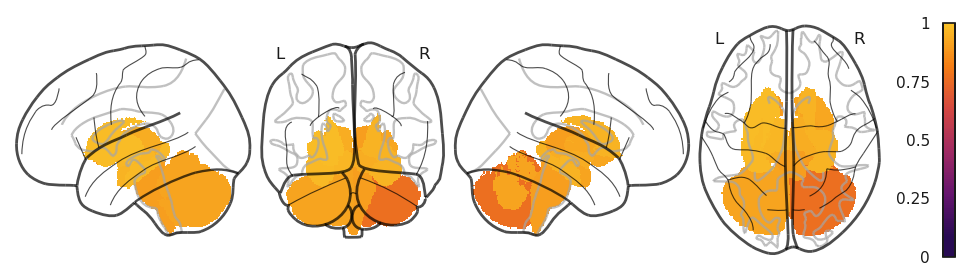

In [41]:
#plot anatomical cortical and subcortical feature importance (from FreeSurfer, Destrieux atlas)
wway = '/media/hcs-psy-narun/Alina/atlases/'
#load atlases
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

cmap = LinearSegmentedColormap.from_list('postv', [#'#280b53', '#280b53', '#280b53',
                                            '#280b53', '#280b53', '#280b53','#280b53', '#280b53', '#280b53',
                                            '#280b53', '#65156e', '#9f2a63', '#d44842', '#f57d15', '#fac228'])


    
#subcortex

#empty image in the same way as reffered atlas
par_dat2 = atlas2.get_fdata()
site_nii2 = np.zeros(par_dat2.shape)
#reorder subc table into atlas order
dtvc = dct_icc_brain['subc'].mask(dct_icc_brain['subc'] < 0.4).fillna(0)
#std
#dtvc = pd.DataFrame(StandardScaler().fit_transform(dtvc.T.values),
#                    index=dtvc.T.index, columns=dtvc.T.columns).T
v2 = dtvc#.mean()
vec2 =pd.Series(v2.values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )
#fill mat with numbers
for index, numb in zip(vec2.index, vec2.iloc[:]): 
    site_nii2[par_dat2 == (index)] = numb
#create image object
site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
#display
print('subc')
display_subc = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap=cmap,  #different colormap
                                         colorbar=True, display_mode='lyrz', 
                                         vmax=1)#vmin=0.4, 

plt.savefig(path_img_out+'ICC_Brain_NoAdj_struct_subc_plot_image.svg',bbox_inches='tight')

plotting.show()

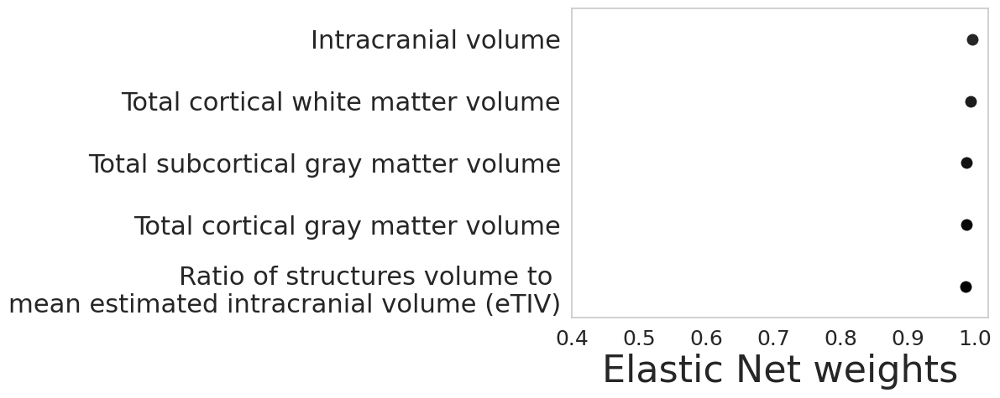

In [28]:
#Total Brain Volume

data = dct_icc_brain['brainVol'].mask(dct_icc_brain['brainVol'] < 0.4).fillna(0)#dct_elnet_coeff['VolBrain']
data.index = ['Intracranial volume',
'Total cortical gray matter volume',
'Total subcortical gray matter volume',
'Total cortical white matter volume',
'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = pd.DataFrame(data.sort_values(ascending=False)).T
#data.T.to_csv(path2+'TBV_plot_numbers.csv')
#sns.boxplot(data=data, orient="h", color='tab:blue')
sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
plt.xlim((0.4,1.02))
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'ICC_Brain_NoAdj_TotalVolume_plot_image.svg',bbox_inches='tight')

plt.show()

##### Resting State and Task FC

In [31]:
#RESTING STATE and TASK FC 

#reorganize from pairs of ROIs back to matrix format
ind_task=dct_icc_brain['stroop'].index

dct_FC_mat = {}
for key in ['rest', 'stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC']:
    #dataframe to convert
    data_i  = dct_icc_brain[key]

    #df_std_FC = pd.DataFrame()
    #standardize
    #for indx in data_i.index:
    #    df_std_FC[indx] = pd.DataFrame(StandardScaler().fit_transform(data_i.loc[indx,:].values.reshape(-1, 1)), 
    #                                   index=data_i.loc[indx,:].index)[0]
    df_std_FC = data_i#.T
    
    #average across folds    
    data = df_std_FC#.mean()

    #restore full matrix
    ind379 = np.triu_indices(379, k=1)
    mat379 = np.zeros((379,379),float)
    mat379[ind379]=data.values
    mat379_2 = pd.DataFrame(mat379).replace(0, np.nan)
    mat379_f = pd.DataFrame(np.where(mat379,mat379_2,mat379_2.T))
    mat379_f.index = ind_task
    mat379_f.columns = ind_task
    
    #save mat to dct
    dct_FC_mat[key] = mat379_f

In [34]:
glanets = pd.read_csv('/media/hcs-psy-narun/Alina/atlases/Glasser-Cole_match_table.txt')

In [35]:
tab_subc = pd.DataFrame({'orig_order':np.arange(361,380,1),
                         'left_first_order':np.arange(361,380,1),
                         'Cole_net_order':np.full(19,13),
                         'name_Glasser':ind_task[-19:],
                         'Cole_net_name':np.full(19,'Subcortex')
                         }, index=np.arange(360,379,1))

In [36]:
glanets = pd.concat([glanets,tab_subc], axis=0)

In [39]:
vec = []
vec_nms = []
k=0
for i in sorted(set(glanets['Cole_net_order'])):
    #print(i)
    display()
    k+= int(len(glanets[glanets['Cole_net_order']==i].index))
    vec+=[k]
    nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
    vec_nms+= [nms]

##### Plot

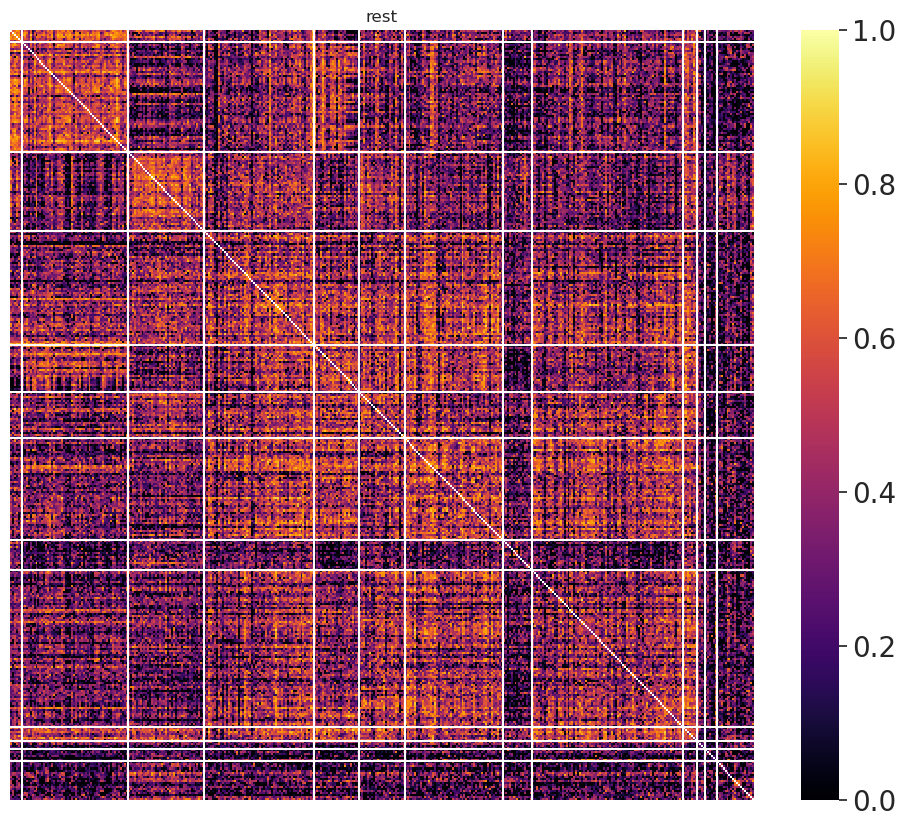

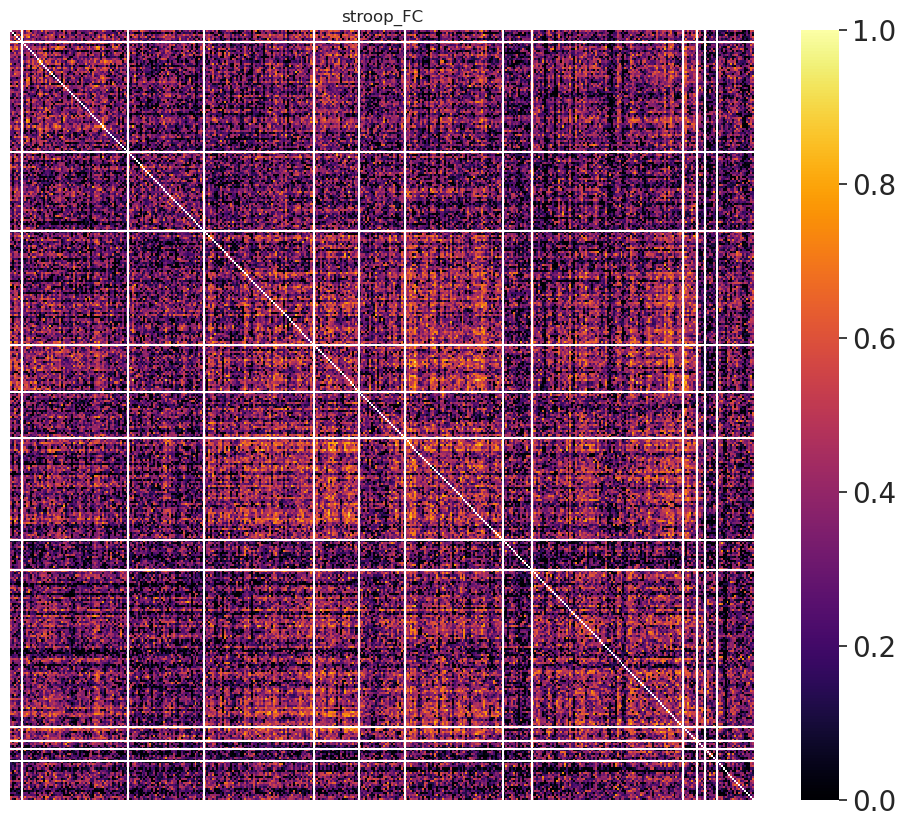

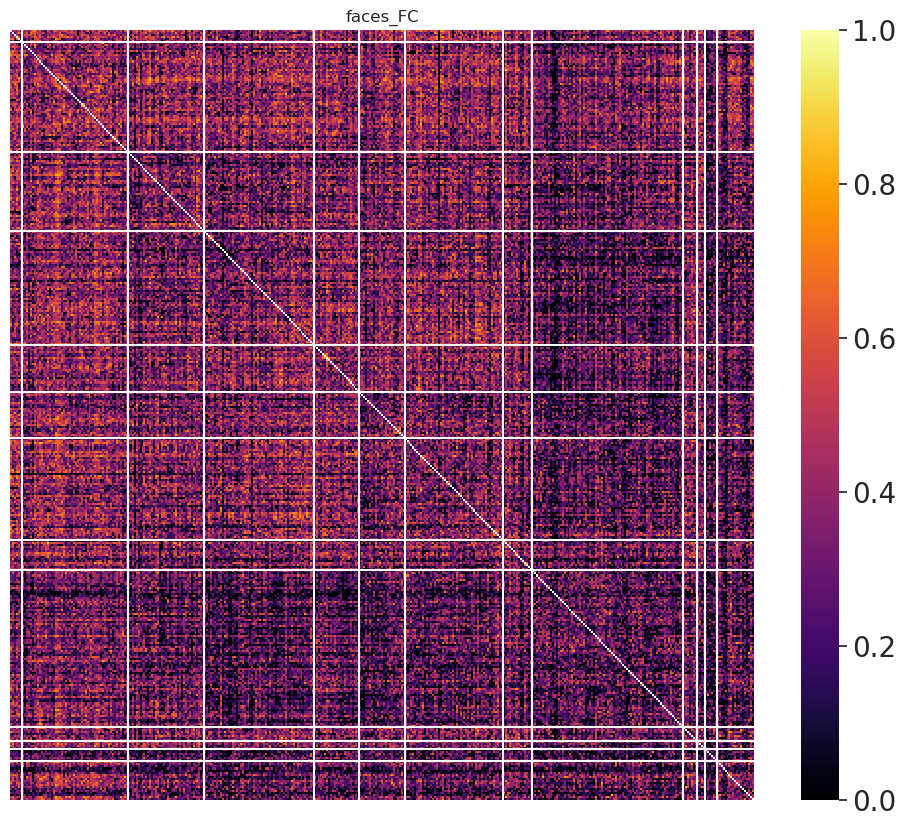

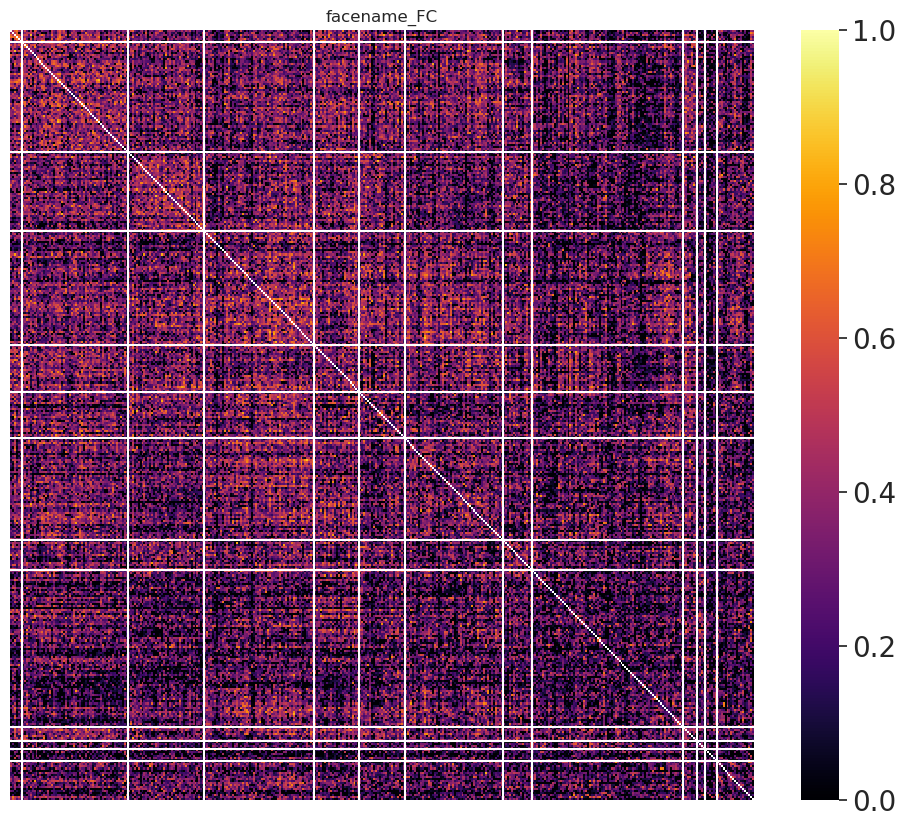

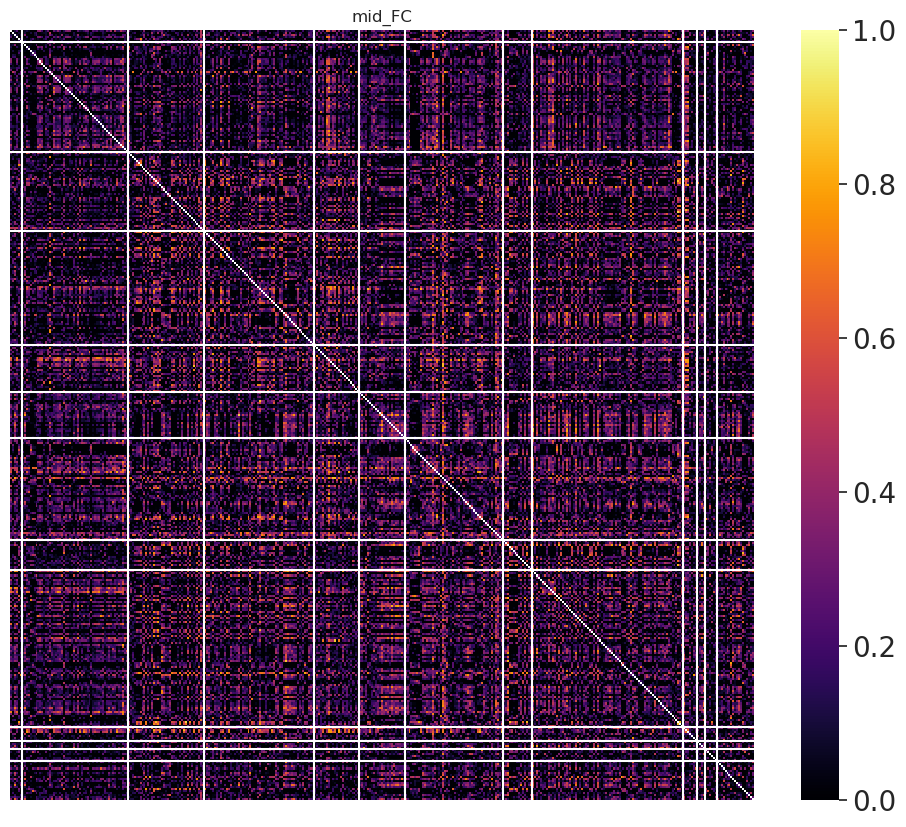

In [42]:
for mod in ['rest', 'stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC']:
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[mod].reindex(index=indx, columns=indx)

    fig= plt.figure(figsize=(12,10))

    ax =sns.heatmap(data=data, cmap='inferno',vmin=0, vmax=1)
    plt.xticks([])
    plt.yticks([])

    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]

    for k in vec[:-1]:
        plt.axvline(x=k, color='white')
        plt.axhline(y=k, color='white')

    # use matplotlib.colorbar.Colorbar object
    cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=20)

    plt.title(mod)
    
    plt.savefig(path_img_out+'ICC_Brain_NoAdj_FCs_'+mod+'_1_plot_image.svg',bbox_inches='tight')
    
    plt.show()

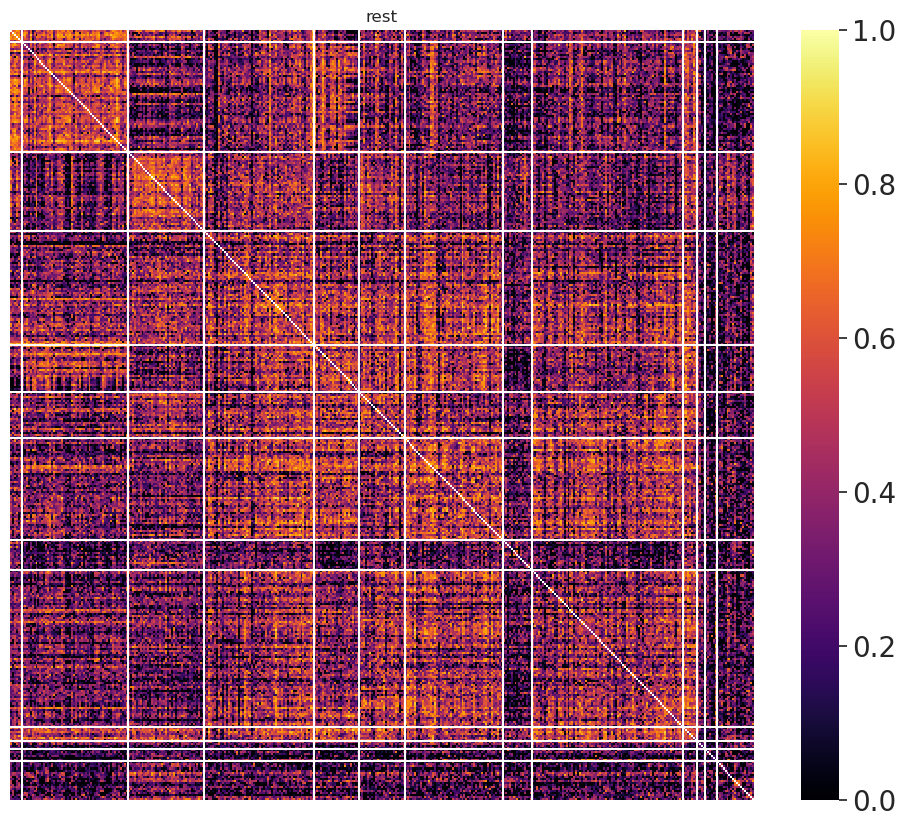

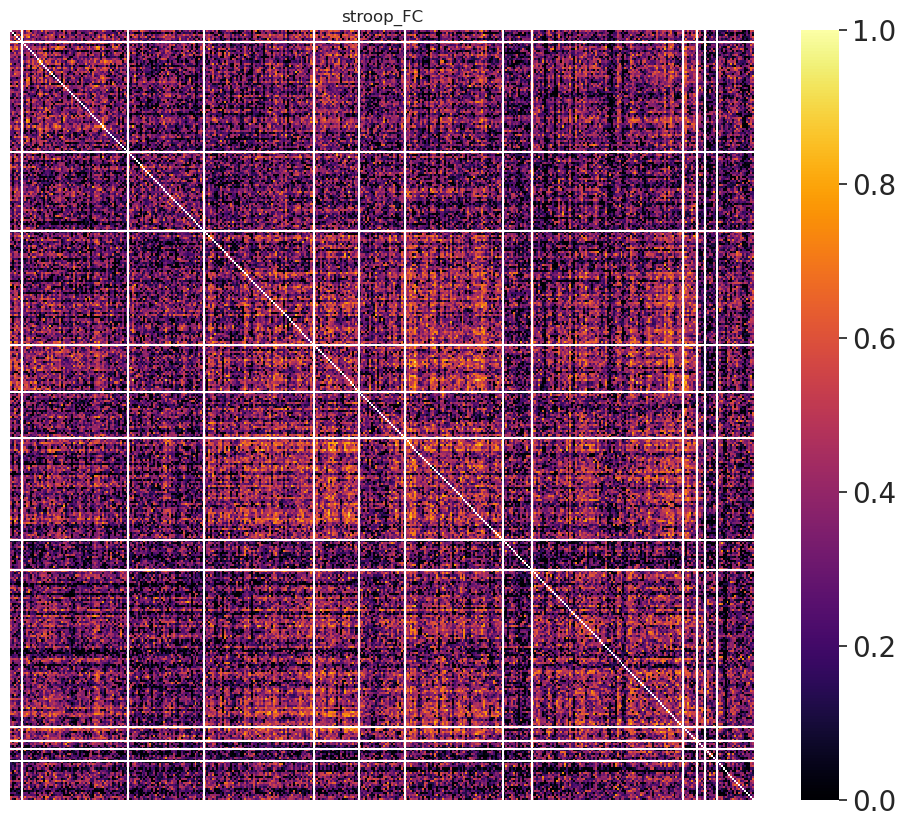

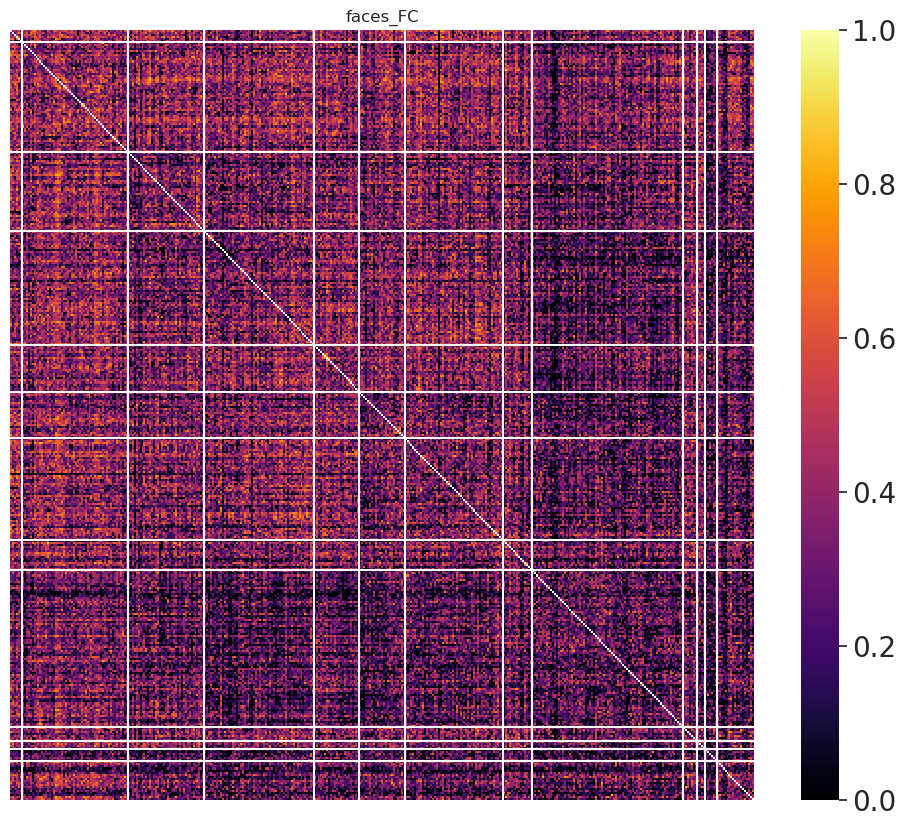

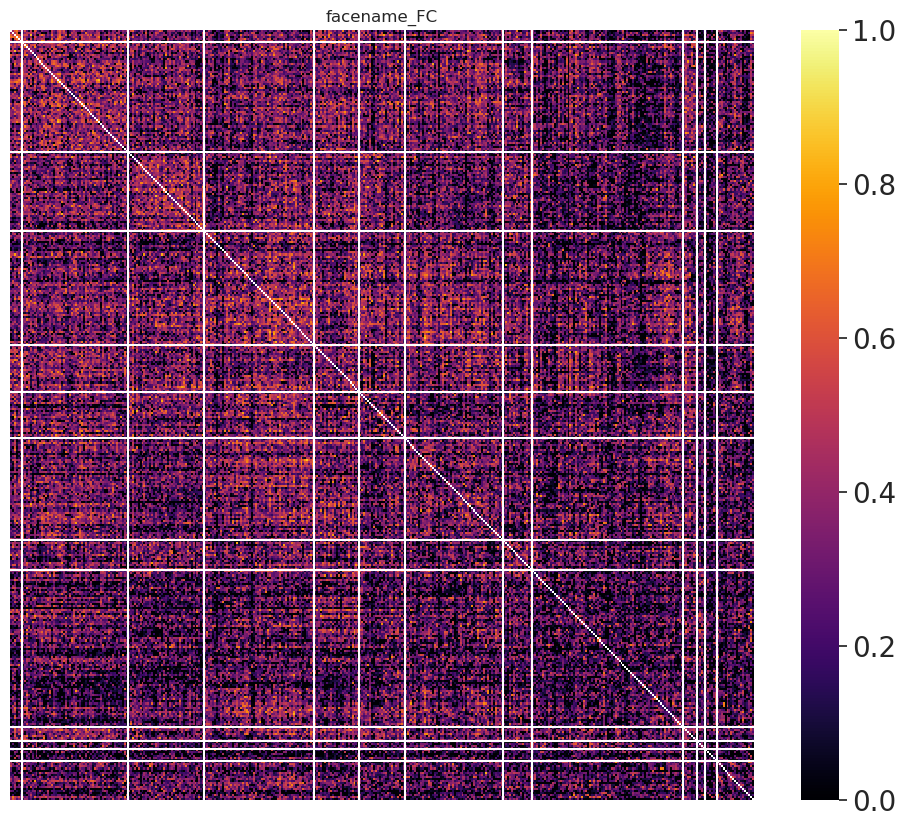

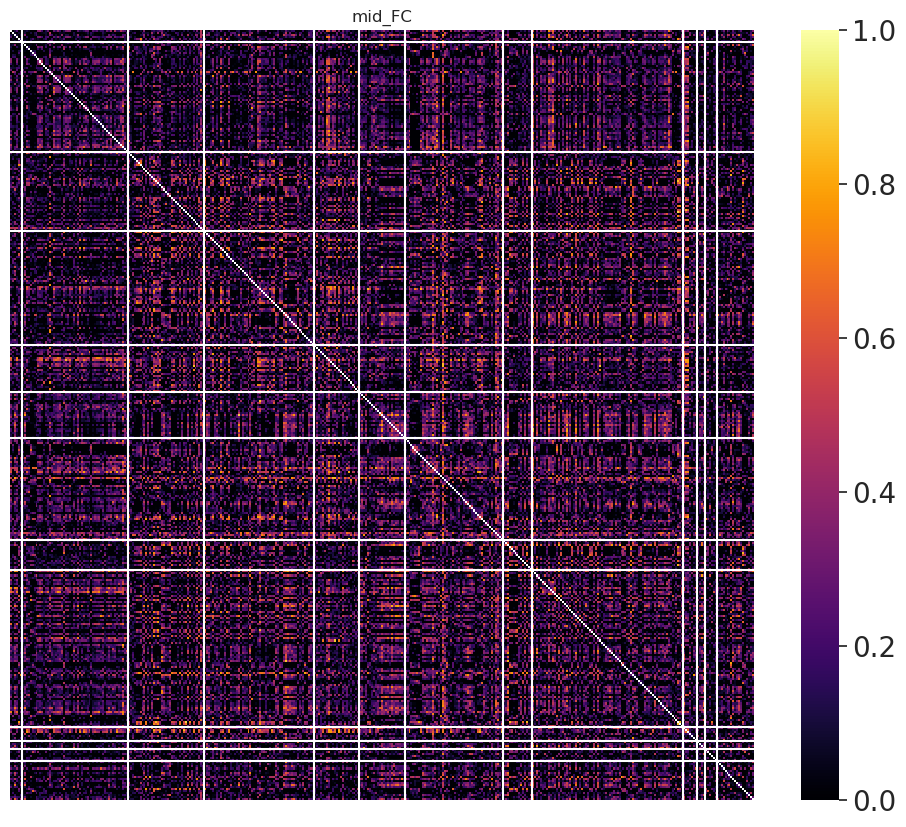

In [43]:
for mod in ['rest', 'stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC']:
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[mod].reindex(index=indx, columns=indx)

    fig= plt.figure(figsize=(12,10))

    ax =sns.heatmap(data=data, cmap='inferno',vmin=0, vmax=1)
    plt.xticks([])
    plt.yticks([])

    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]

    for k in vec[:-1]:
        plt.axvline(x=k, color='white')
        plt.axhline(y=k, color='white')

    # use matplotlib.colorbar.Colorbar object
    cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=20)

    plt.title(mod)
    
    plt.savefig(path_img_out+'ICC2_Brain_NoAdj_FCs_'+mod+'_1_plot_image.png',bbox_inches='tight')
    
    plt.show()

rest


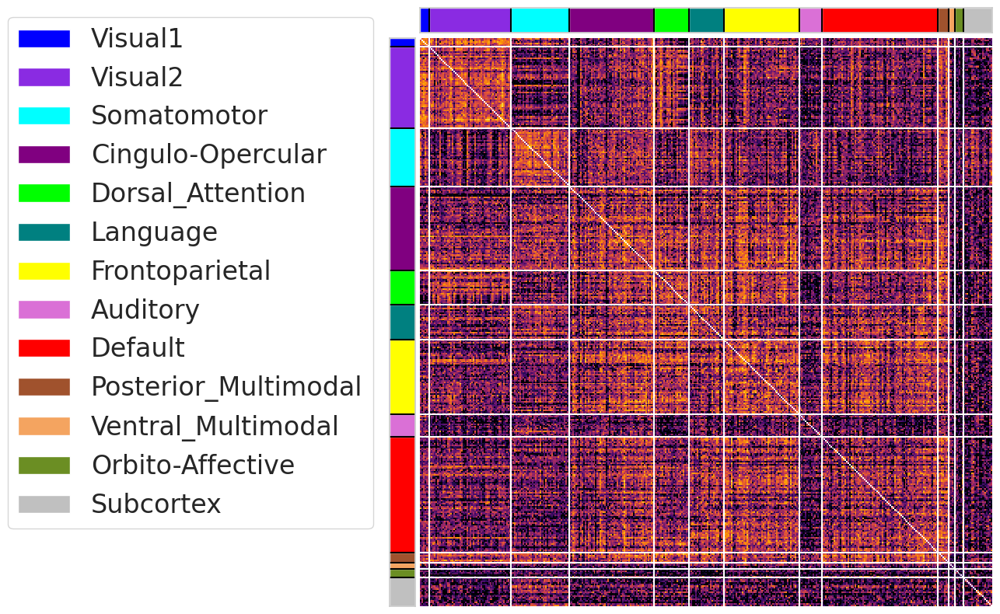

stroop_FC


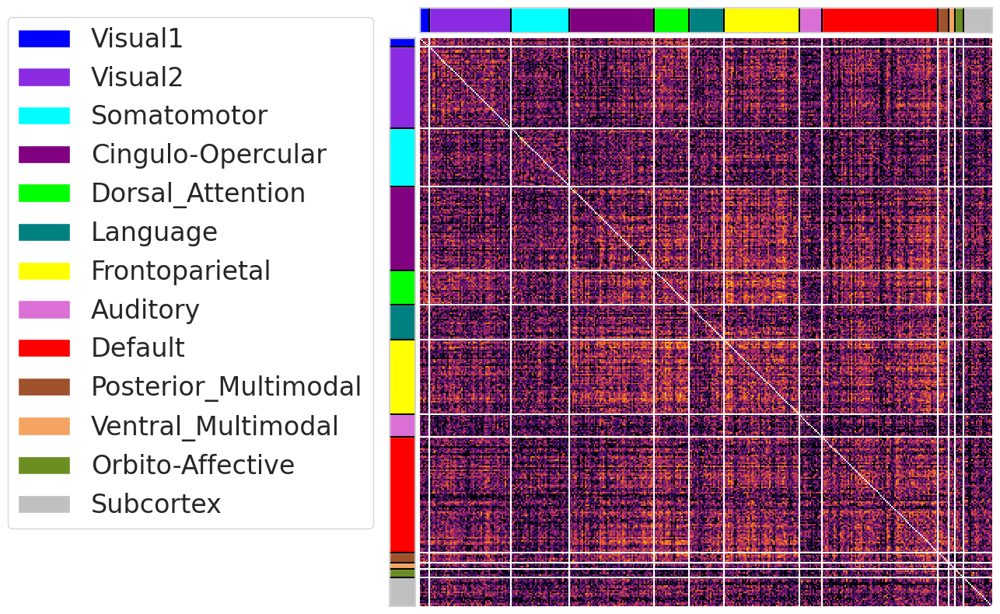

faces_FC


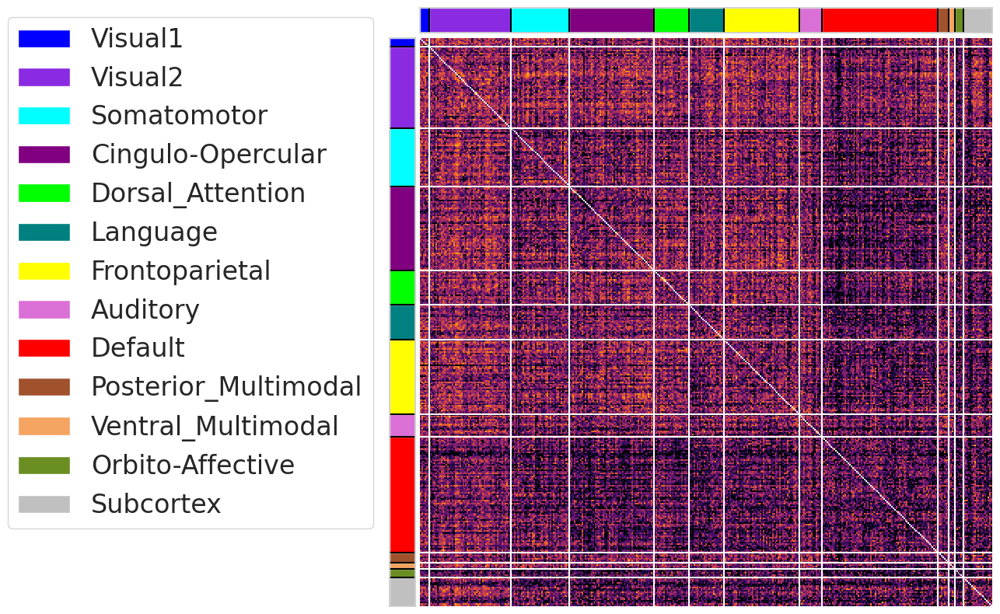

facename_FC


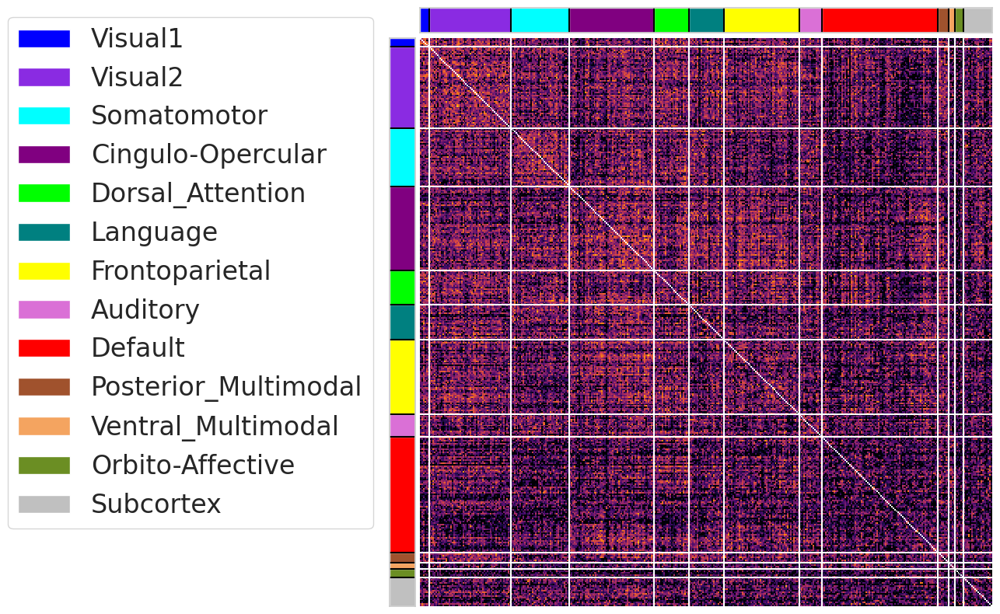

mid_FC


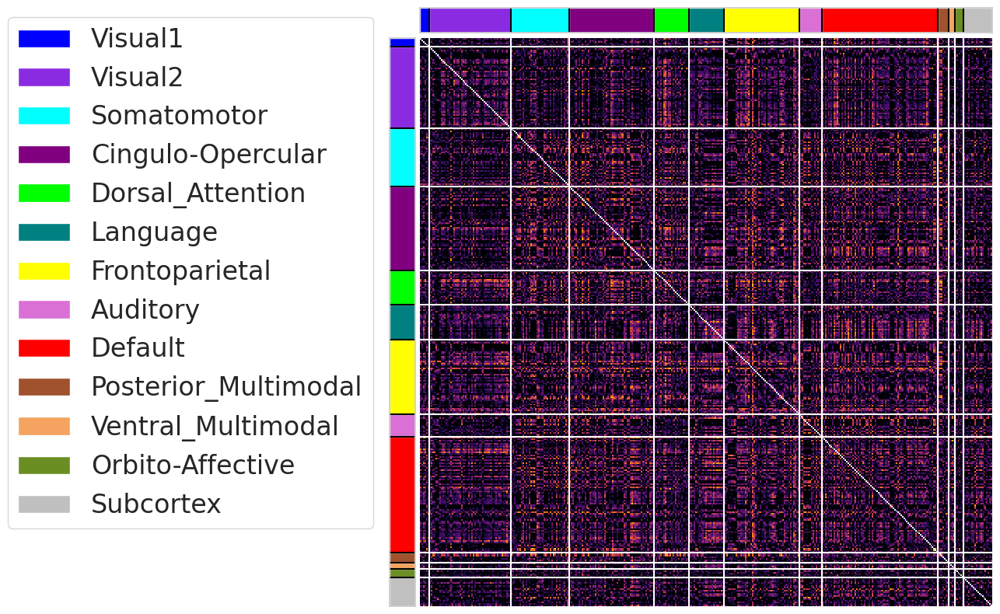

In [44]:
for mod in ['rest', 'stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC']:
    print(mod)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[mod].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='white')
        ax3.axhline(y=k, color='white')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='inferno',vmin=0, vmax=1,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])
    
    plt.savefig(path_img_out+'ICC_Brain_NoAdj_FCs_'+mod+'_2_plot_image.svg',bbox_inches='tight')
    
    plt.show()

rest


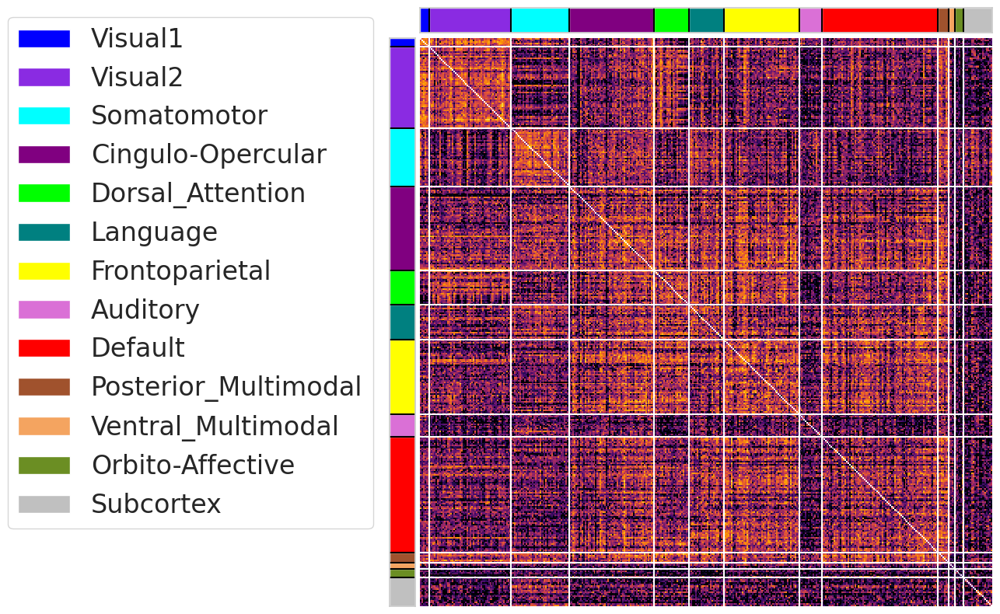

stroop_FC


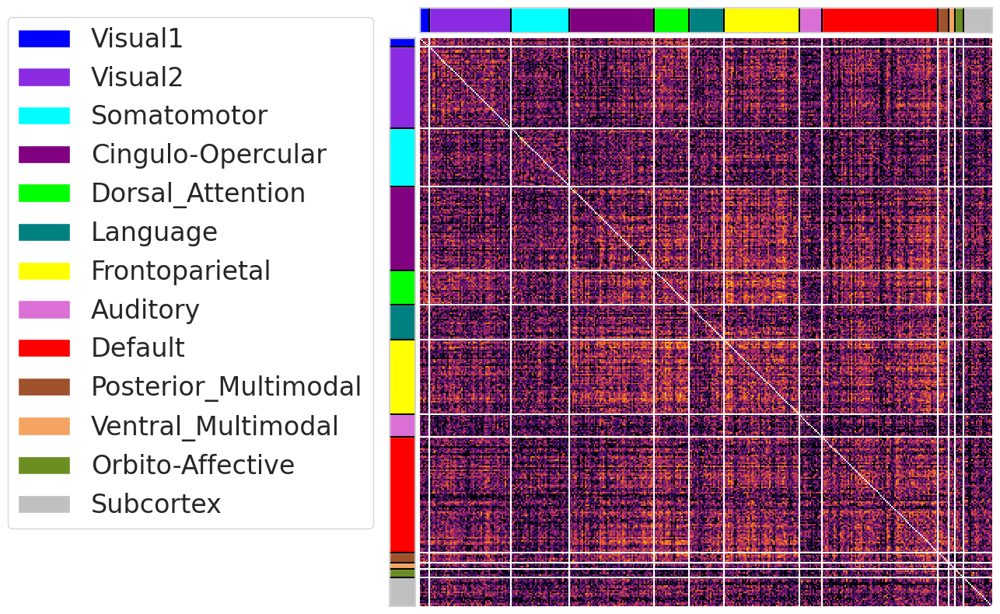

faces_FC


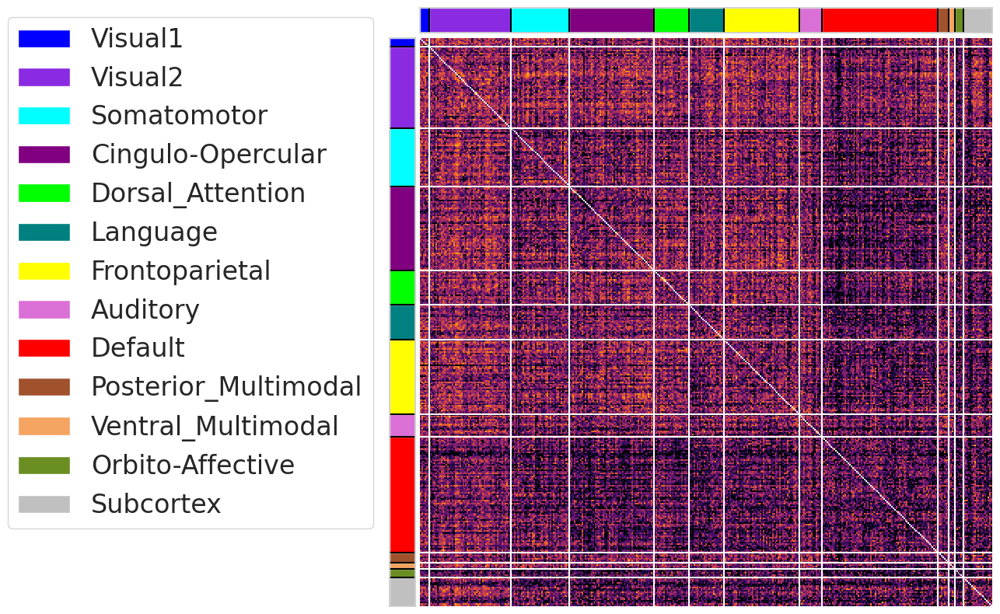

facename_FC


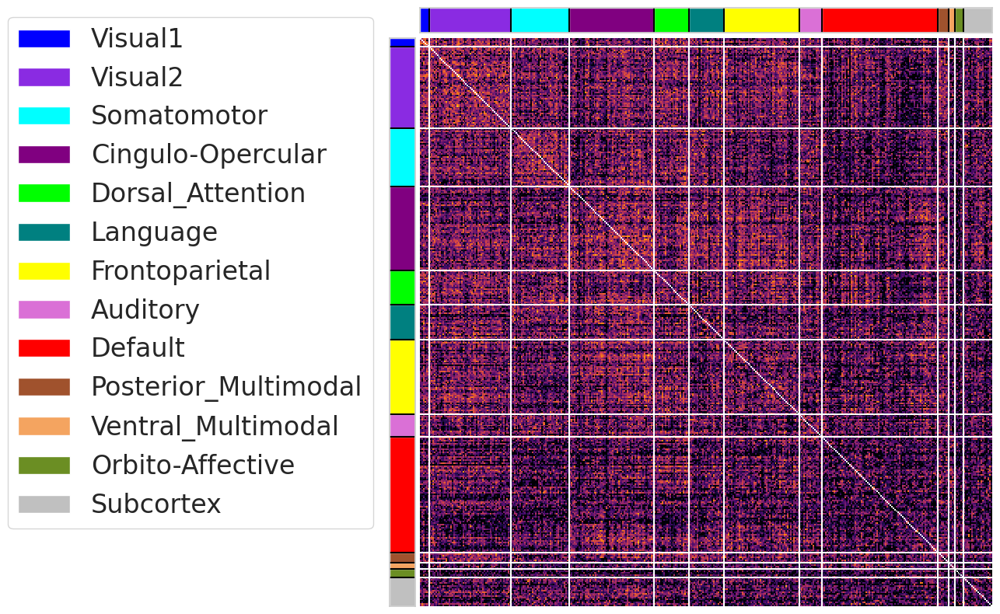

mid_FC


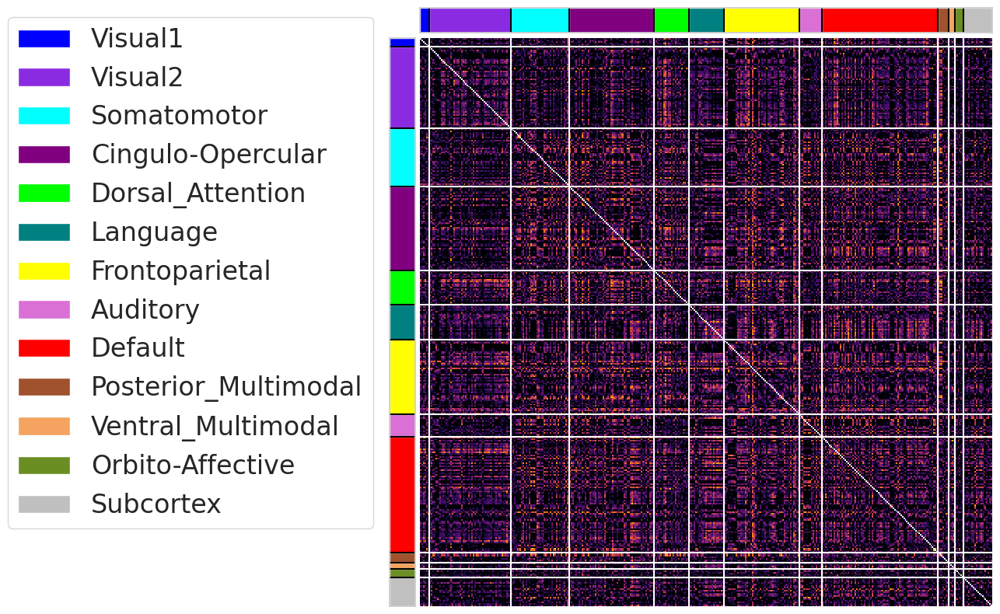

In [45]:
for mod in ['rest', 'stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC']:
    print(mod)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[mod].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='white')
        ax3.axhline(y=k, color='white')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='inferno',vmin=0, vmax=1,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])
    
    plt.savefig(path_img_out+'ICC2_Brain_NoAdj_FCs_'+mod+'_2_plot_image.png',bbox_inches='tight')
    
    plt.show()

In [46]:
#Mean ICC values for Cole nets for each FC modality

for mod in ['rest', 'stroop_FC', 'faces_FC', 'facename_FC', 'mid_FC']:
    print(mod, 'nets mean icc values')
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[mod].reindex(index=indx, columns=indx)
    net_icc = {}
    for i in sorted(set(glanets['Cole_net_name'])):
        indxs = glanets[glanets['Cole_net_name']==i]['name_Glasser'].values
        df= data.reindex(index=indxs, columns=indxs)
        df = df.where(np.triu(np.ones(df.shape)).astype(np.bool))
        df = df.stack().reset_index()
        df.columns = ['Row','Column','Value']
        net_icc[i] = df['Value'].mean()
    net_icc = pd.Series(net_icc)

    display(net_icc.sort_values(ascending=False))

rest nets mean icc values


Visual1                 0.643523
Posterior_Multimodal    0.546364
Somatomotor             0.521806
Visual2                 0.500999
Dorsal_Attention        0.485303
Frontoparietal          0.484907
Cingulo-Opercular       0.435254
Language                0.431235
Default                 0.381770
Auditory                0.272442
Ventral_Multimodal      0.261166
Subcortex               0.202838
Orbito-Affective        0.158440
dtype: float64

stroop_FC nets mean icc values


Posterior_Multimodal    0.410978
Visual1                 0.406735
Frontoparietal          0.398404
Dorsal_Attention        0.355589
Default                 0.333484
Ventral_Multimodal      0.327070
Visual2                 0.314529
Cingulo-Opercular       0.309540
Language                0.298085
Somatomotor             0.288308
Subcortex               0.229142
Orbito-Affective        0.205650
Auditory                0.184507
dtype: float64

faces_FC nets mean icc values


Ventral_Multimodal      0.460747
Visual2                 0.375267
Visual1                 0.343945
Posterior_Multimodal    0.339374
Dorsal_Attention        0.327287
Auditory                0.326737
Cingulo-Opercular       0.314315
Frontoparietal          0.312586
Somatomotor             0.308705
Subcortex               0.291363
Language                0.278971
Orbito-Affective        0.246134
Default                 0.223821
dtype: float64

facename_FC nets mean icc values


Visual1                 0.477300
Somatomotor             0.354118
Visual2                 0.353449
Cingulo-Opercular       0.338227
Posterior_Multimodal    0.332352
Dorsal_Attention        0.319053
Auditory                0.306935
Frontoparietal          0.267093
Language                0.257629
Ventral_Multimodal      0.200581
Subcortex               0.190807
Default                 0.160772
Orbito-Affective        0.071006
dtype: float64

mid_FC nets mean icc values


Language                0.159172
Frontoparietal          0.125940
Posterior_Multimodal    0.114105
Ventral_Multimodal      0.084617
Default                 0.080397
Visual2                 0.079398
Somatomotor             0.071316
Cingulo-Opercular       0.069901
Dorsal_Attention        0.058167
Auditory                0.031922
Visual1                 0.026718
Subcortex               0.011099
Orbito-Affective       -0.014545
dtype: float64